In [2]:
import os
os.chdir('../../../../')

In [3]:
import sys,os
sys.path.append(os.path.abspath('lab4/src'))

from Transformations.transformers.Kmers import Kmers
from Transformations.transformers.Normalize import Normalize
import numpy as np

from IO.RNA_IO import RNA_IO

from utils import pathify_pdb

RF00162


In [4]:
rna_io=RNA_IO()
pdb_path=pathify_pdb("7eaf")
X,y= rna_io.read(pdb_path, "PDB")

# kmers and one hot

In [ ]:
kmers,_=Kmers(k=3).transform(X)

In [ ]:
kmers.shape

In [ ]:
X_transformed=kmers

In [ ]:
X.shape
X

In [ ]:
X_transformed #kmer transformed X

In [ ]:
import numpy as np
test_x_trans=np.empty((len(X),len(X[0]) - 3 + 1),dtype=object)
# test_x_trans[1,]

for i, seq in enumerate(X):
    kmers_ = [seq[j:j+3] for j in range(len(seq) - 3 + 1)]
    test_x_trans[i]=kmers_

test_x_trans.shape

In [ ]:
X.shape

In [ ]:
kmers[0,1]

In [ ]:
kmers[0][0]

In [ ]:
X_transformed.shape[1]

proof of successful one hot encoding on kmerized X

In [ ]:
ALPHABET=['A','C','U','G']
from itertools import product
k=len(X_transformed[0][0])
colnames_all_kmers=["".join(i) for i in product(ALPHABET, repeat=k)]
# colnames_all_kmers # -- successful
import numpy as np
new_X=np.zeros((X_transformed.shape[0],X_transformed.shape[1],len(colnames_all_kmers)),dtype=int)


for i, seq in enumerate(X_transformed):
    for j, kmer in enumerate(seq):
        index=colnames_all_kmers.index(kmer)
        new_X[i,j,index]=1

print(X_transformed[0])
new_X[:,:,3]
# colnames_all_kmers.index("AAG")

In [ ]:
from Transformations.transformers.OneHotEncoding import OneHotEncoding

X_transformed_2,_=OneHotEncoding().transform(X_transformed) #--output from Kmers
X_transformed_2.shape

In [ ]:
X_transformed_1_prime,_=OneHotEncoding().transform(X) #--output from X raw
X_transformed_1_prime.shape

# distogram

According to the PDB file format documentation: "ATOM records for proteins are listed from amino to carboxyl terminus. Nucleic acid residues are listed from the 5' to the 3' terminus." [^1]. Thus there is no consensus on the order of atoms enlisted, moreover, some atoms may be missing, others can be nucleic residue specific. For now, the input atom list are indices of atoms, since the order from 5' to 3' is the only generalizable and relevant order.

[^1]: wwPDB file format documentation _https://www.wwpdb.org/documentation/file-format-content/format33/sect9.html_

In [5]:
y.shape

(1, 94, 44, 3)

In [6]:
atoms=[1,3,5]
b=5

In [7]:
y[0][0][0].shape,type(y[0][0][0])

((3,), numpy.ndarray)

In [8]:
euclidean_distance=lambda coords1, coords2: float(np.sqrt(np.sum((coords1-coords2)**2)))
# euclidean_distance(y[0][0][0],y[0][1][0]) #-- successful

In [ ]:
y.shape #-- 1 model=1 structure, 94 residues per 1 structure, 44 atoms per residue, 3 coordinates per atom

(1, 94, 44, 3)

In [16]:
for m,atom_idx in enumerate(atoms):
    print("m:",m)
    print("atom_idx:",atom_idx)

m: 0
atom_idx: 1
m: 1
atom_idx: 3
m: 2
atom_idx: 5


In [17]:
y_single_structure.shape

(94, 44, 3)

In [ ]:
k=len(atoms) #number of atoms used (distogram will be of dim L x L x k)
L=y.shape[1] #number of residues

distogram=np.zeros((L,L,k),dtype=float) #-- distogram of shape L x L x k

y_single_structure=y[0] #-- 1 structure

for i in range(L):
    for j in range(L):
        if i!=j:
            for m,atom_idx in enumerate(atoms):
                distogram[i,j,m]=euclidean_distance(y_single_structure[i][atom_idx],y_single_structure[j][atom_idx])
        else:
            for m,atom in enumerate(atoms):
                distogram[i,j,m]=0.0

distogram.shape #-- 94 x 94 x 3
                

(94, 94, 3)

In [ ]:
L=y.shape[1] #number of residues
# we have atoms and k

y_transformed=np.zeros((y.shape[0],L,L,k),dtype=float) #-- array of shape num_structures x L x L x k (contains all distograms)

for s_idx in range(y.shape[0]): #-- loop over all structures, create a distogram for each
    distogram=np.zeros((L,L,k),dtype=float) #-- distogram of shape L x L x k
    y_single_structure=y[s_idx] #-- 1 structure

    for i in range(L):
        for j in range(L):
            if i!=j:
                for m,atom_idx in enumerate(atoms):
                    distogram[i,j,m]=euclidean_distance(y_single_structure[i][atom_idx],y_single_structure[j][atom_idx])
            else:
                for m,atom in enumerate(atoms):
                    distogram[i,j,m]=0.0

    y_transformed[s_idx]=distogram #-- add distogram to the list of distogram

y_transformed.shape #-- 1 structure=94 residues, 94 residues, 3 atoms
    

(1, 94, 94, 3)

In [85]:
def transform(X, Y, atoms=1, b=None):
    '''
    `Distogram().transform(X,Y)`: Distogram's transform method, Computing a distogram from the coordinates of the atoms in the RNA structure  

    parameters:

    - X: np.ndarray, sequence data | mandatory
    - Y: np.ndarray or dict, dict containing Original item that is nparray -> coordinates data (3D coordinates of atoms) | mandatory
    - atoms: list or int (optional), list of atom indices (or 1 atom index) to be used for distogram calculation (default set to 1st atom in 5'-3' direction)
    - b: int (optional), number of buckets for discretization (if None, no bucketing is performed)

    returns:
    - X: np.ndarray, sequence data (unchanged)
    - Y_transformed: np.ndarray, distogram data

    :description:  
    - distogram is a 2d matrix showing residues x residues matrix of distances
    - each structure in y is transformed into a distogram (number of structures in y <=> nrows in y <=> number of distograms)
    - all distograms will be concatenated in a single ndarray suc that nrows in y_transformed = nrows in y
    - distogram is of shape (L x L x k) where L is the number of residues and k is the number of atoms used (3D matrix showing residues x residues x atoms given)
    - if k=1, distogram is of shape (L x L)
    - if b is given, i.e. user wants to split distances in b buckets, distogram is of shape (L x L x k x b) or (L x L x b) if k=1

    *whats bucketing?*
    > bucketing is a process of splitting the distances into b buckets (or bins) to create a histogram-like representation of the distances
    > for example, if the maximum distance is 10 and b=5, the distances will be split into 5 buckets of size 2 (0-2, 2-4, 4-6, 6-8, 8-10)
    > if a distance falls into a bucket, the corresponding bucket in the distogram will be set to 1
    > it's a way to perform discretization of the distances, this model is used in AlphaFold3

    '''

    euclidean_distance=lambda coords1, coords2: float(np.sqrt(np.sum((coords1-coords2)**2)))
    L=X.shape[1] #number of residues

    if not isinstance(atoms,list):
        atoms=[atoms]
    k=len(atoms) #number of atoms used (distogram will be of dim L x L x k)

    if isinstance(Y, np.ndarray):
        raw_y=Y
    elif isinstance(Y, dict) and 'original' in list(Y.keys()):
        raw_y=Y['original']
    else:
        raise ValueError("Invalid input for Y: Expected numpy array or dictionary with 'original' key")
    
    Y_transformed = np.zeros((len(raw_y), L, L, k), dtype=float)
    max_distance = 0.0 #needed for discretization

    for s_idx in range(Y_transformed.shape[0]): #-- loop over all structures, create a distogram for each
        distogram=np.zeros((L,L,k),dtype=float)
        y_single_structure=raw_y[s_idx]
        for i in range(L):
            for j in range(L):
                if i!=j:
                    for m,atom_idx in enumerate(atoms):
                        d=euclidean_distance(y_single_structure[i][atom_idx],y_single_structure[j][atom_idx])
                        distogram[i,j,m]=d
                        if d>max_distance:
                            max_distance=d
                else:
                    for m,atom in enumerate(atoms):
                        distogram[i,j,m]=0.0                        

        Y_transformed[s_idx]=distogram #-- add distogram to the list of distograms

    # -- BUCKETING option
    if b and isinstance(b, int):
        new_Y_transformed=np.zeros((Y_transformed.shape[0], Y_transformed.shape[1], Y_transformed.shape[2], Y_transformed.shape[3], b), dtype=int)
        bucket_distance=max_distance/b
        for s_idx in range(Y_transformed.shape[0]):
            distogram=Y_transformed[s_idx]
            for i in range(L):
                for j in range(L):
                    if i!=j: #if same residue no bucket should be filled
                        for m in range(k):
                            current_distance=distogram[i,j,m]
                            
                            bucket_idx=int(current_distance/bucket_distance)

                            if current_distance==max_distance: #if max distance, division wil yield an index out of bound (=b)
                                bucket_idx=b-1

                            new_Y_transformed[s_idx,i,j,m,bucket_idx]=1
        Y_transformed=new_Y_transformed


    #--checking atoms dimension (3rd one), if only one atom is given squeeze it
    if Y_transformed.shape[3]==1:
        Y_transformed=np.squeeze(Y_transformed, axis=3)

    if isinstance(Y, dict):
        Y['Distogram'] = Y_transformed
    else:
        Y={'Original': Y, 'Distogram': Y_transformed}

    return X, Y_transformed
    

In [88]:
X,y= rna_io.read(pdb_path, "PDB")

In [90]:
_, y_transformed=transform(X, y, [1,2,3,4,5],5) #-- 1 structure, 94 residues x 94 residues, 3 atoms in the atoms list
y_transformed.shape #-- 1 structure, 94 residues x 94 residues, 3 atoms in the atoms list

(1, 94, 94, 5, 5)

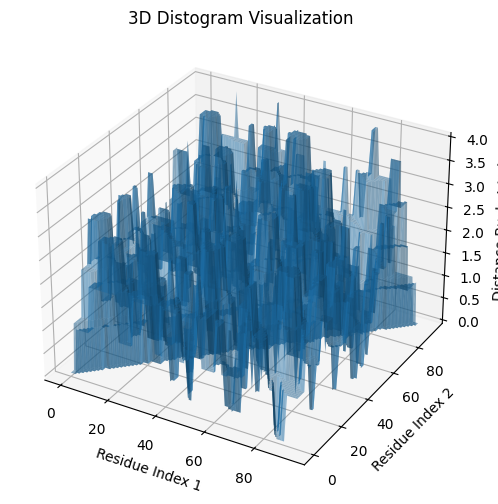

In [72]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Assuming distogram is a 3D NumPy array
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Create a meshgrid for the x, y coordinates
x = np.arange(y_transformed.shape[1])
y = np.arange(y_transformed.shape[2])
# make z the index of the bin that has a 1 value
z = np.arange(y_transformed.shape[3])
X, Y = np.meshgrid(x, y)
Z = np.zeros_like(X)
for i in range(y_transformed.shape[1]):
    for j in range(y_transformed.shape[2]):
        for k in range(y_transformed.shape[3]):
            if y_transformed[0,i,j,k]==1:
                Z[i,j]=k

# Plot the surface
ax.plot_surface(X, Y, Z, alpha=0.5, rstride=1, cstride=1)
ax.set_xlabel('Residue Index 1')
ax.set_ylabel('Residue Index 2')
ax.set_zlabel('Distance Bucket Index')
ax.set_title('3D Distogram Visualization')
plt.show()

In [74]:
y_transformed

array([[[[0, 0, 0, 0, 0],
         [1, 0, 0, 0, 0],
         [1, 0, 0, 0, 0],
         ...,
         [0, 1, 0, 0, 0],
         [0, 1, 0, 0, 0],
         [0, 1, 0, 0, 0]],

        [[1, 0, 0, 0, 0],
         [0, 0, 0, 0, 0],
         [1, 0, 0, 0, 0],
         ...,
         [0, 1, 0, 0, 0],
         [0, 1, 0, 0, 0],
         [0, 1, 0, 0, 0]],

        [[1, 0, 0, 0, 0],
         [1, 0, 0, 0, 0],
         [0, 0, 0, 0, 0],
         ...,
         [0, 1, 0, 0, 0],
         [0, 1, 0, 0, 0],
         [0, 1, 0, 0, 0]],

        ...,

        [[0, 1, 0, 0, 0],
         [0, 1, 0, 0, 0],
         [0, 1, 0, 0, 0],
         ...,
         [0, 0, 0, 0, 0],
         [1, 0, 0, 0, 0],
         [1, 0, 0, 0, 0]],

        [[0, 1, 0, 0, 0],
         [0, 1, 0, 0, 0],
         [0, 1, 0, 0, 0],
         ...,
         [1, 0, 0, 0, 0],
         [0, 0, 0, 0, 0],
         [1, 0, 0, 0, 0]],

        [[0, 1, 0, 0, 0],
         [0, 1, 0, 0, 0],
         [0, 1, 0, 0, 0],
         ...,
         [1, 0, 0, 0, 0],
        

In [81]:
distogram.dtype

NameError: name 'distogram' is not defined

In [ ]:
import plotly.graph_objects as go
import numpy as np

def view_distogram(y_transformed):
    '''
    takes a dict of y transformations, and viz the distogram through interactive landscape and heatmaps
    '''
    y_dist=y_transformed['Distogram']
    fig = go.Figure()
    colormaps=['viridis', 'plasma', 'magma', 'cividis', 'inferno', 'YlGnBu', 'YlOrRd', 'Blues', 'Greens', 'Reds']

    match y_dist.dtype:
        case 'int64': #if bucketized
            for idx in range(y_transformed.shape[0]):
                x = np.arange(y_transformed.shape[1])
                y = np.arange(y_transformed.shape[2])
                z = np.arange(y_transformed.shape[3])
                X, Y = np.meshgrid(x, y)
                Z = np.zeros_like(X)

                # Populate Z with the index of the bin that has a value of 1
                for i in range(y_transformed.shape[1]):
                    for j in range(y_transformed.shape[2]):
                        for k in range(y_transformed.shape[3]):
                            if y_transformed[idx, i, j, k] == 1:
                                Z[i, j] = k

                # Offset Z by the index of the first dimension to stack the plots
                Z += idx * y_transformed.shape[3]

                # Add a surface for each item
                fig.add_trace(go.Surface(
                    z=Z,
                    x=X,
                    y=Y,
                    showscale=False,
                    colorscale=colormaps[idx],  # You can change this to other colormaps
                    opacity=0.7,
                    name=f"Item {idx}"
                ))
        case 'float32':
            # Loop through all slices of the distogram
            for i in range(distogram.shape[2]):
                data = distogram[:, :, i]
                x = np.arange(data.shape[1])
                y = np.arange(data.shape[0])
                X, Y = np.meshgrid(x, y)

                # Add a surface for each slice
                fig.add_trace(go.Surface(
                    z=data,
                    x=X,
                    y=Y,
                    colorscale=colormaps[i],  # You can change this to other Plotly colormaps
                    # put legend colors in the same order as the slices
                    showscale=False,  # Hide color scale for better visualization
                    opacity=0.7-i*0.1,  # Set transparency for overlapping slices
                    name=f"Slice {i}"
                ))

        # Update layout for better visualization
        fig.update_layout(
            title="Distogram (3D Visualization of All Slices)",
            scene=dict(
                xaxis_title="X-axis Residue Index",
                yaxis_title="Y-axis Residue Index",
                zaxis_title="Distance"
            ),
            margin=dict(l=0, r=0, t=50, b=0)
        )

        # Show the plot
        fig.show()

SyntaxError: invalid syntax (805819132.py, line 62)

In [82]:
y_transformed.dtype

dtype('int64')

In [ ]:
import plotly.graph_objects as go
import numpy as np

# Assuming y_transformed is a 4D NumPy array
fig = go.Figure()



# Loop through each item in the first dimension of y_transformed
for idx in range(y_transformed.shape[0]):
    x = np.arange(y_transformed.shape[1])
    y = np.arange(y_transformed.shape[2])
    z = np.arange(y_transformed.shape[3])
    X, Y = np.meshgrid(x, y)
    Z = np.zeros_like(X)

    # Populate Z with the index of the bin that has a value of 1
    for i in range(y_transformed.shape[1]):
        for j in range(y_transformed.shape[2]):
            for k in range(y_transformed.shape[3]):
                if y_transformed[idx, i, j, k] == 1:
                    Z[i, j] = k

    # Offset Z by the index of the first dimension to stack the plots
    Z += idx * y_transformed.shape[3]
    colormaps=['viridis', 'plasma', 'magma', 'cividis', 'inferno', 'YlGnBu', 'YlOrRd', 'Blues', 'Greens', 'Reds']

    # Add a surface for each item
    fig.add_trace(go.Surface(
        z=Z,
        x=X,
        y=Y,
        colorscale=colormaps[idx],  # You can change this to other colormaps
        opacity=0.7,
        name=f"Item {idx}"
    ))

# Update layout for better visualization
fig.update_layout(
    title="3D Distogram Visualization (Stacked)",
    scene=dict(
        xaxis_title="Residue Index 1",
        yaxis_title="Residue Index 2",
        zaxis_title="Distance Bucket Index"
    ),
    margin=dict(l=0, r=0, t=50, b=0),
    showlegend=False
)

# Show the plot
fig.show()

In [ ]:
import plotly.graph_objects as go
import numpy as np

# Assuming y_transformed is a 4D NumPy array
# Create a meshgrid for the x, y coordinates


x = np.arange(y_transformed.shape[1])
y = np.arange(y_transformed.shape[2])
z = np.arange(y_transformed.shape[y_transformed.ndim - 1])
X, Y = np.meshgrid(x, y)
Z = np.zeros_like(X)

# Populate Z with the index of the bin that has a value of 1
for i in range(y_transformed.shape[1]):
    for j in range(y_transformed.shape[2]):
        for k in range(y_transformed.shape[3]):
            if y_transformed[0, i, j, k] == 1:
                Z[i, j] = k

# Create the 3D surface plot using Plotly
fig = go.Figure()

fig.add_trace(go.Surface(
    z=Z,
    x=X,
    y=Y,
    colorscale='Viridis',  # You can change this to other colormaps
    opacity=0.7
))

# Update layout for better visualization
fig.update_layout(
    title="3D Distogram Visualization",
    scene=dict(
        xaxis_title="Residue Index 1",
        yaxis_title="Residue Index 2",
        zaxis_title="Distance Bucket Index"
    ), 
    margin=dict(l=0, r=0, t=50, b=0)
)

# Show the plot
fig.show()

In [68]:
y_transformed

array([[[[0, 0, 0, 0, 0],
         [1, 0, 0, 0, 0],
         [1, 0, 0, 0, 0],
         ...,
         [0, 1, 0, 0, 0],
         [0, 1, 0, 0, 0],
         [0, 1, 0, 0, 0]],

        [[1, 0, 0, 0, 0],
         [0, 0, 0, 0, 0],
         [1, 0, 0, 0, 0],
         ...,
         [0, 1, 0, 0, 0],
         [0, 1, 0, 0, 0],
         [0, 1, 0, 0, 0]],

        [[1, 0, 0, 0, 0],
         [1, 0, 0, 0, 0],
         [0, 0, 0, 0, 0],
         ...,
         [0, 1, 0, 0, 0],
         [0, 1, 0, 0, 0],
         [0, 1, 0, 0, 0]],

        ...,

        [[0, 1, 0, 0, 0],
         [0, 1, 0, 0, 0],
         [0, 1, 0, 0, 0],
         ...,
         [0, 0, 0, 0, 0],
         [1, 0, 0, 0, 0],
         [1, 0, 0, 0, 0]],

        [[0, 1, 0, 0, 0],
         [0, 1, 0, 0, 0],
         [0, 1, 0, 0, 0],
         ...,
         [1, 0, 0, 0, 0],
         [0, 0, 0, 0, 0],
         [1, 0, 0, 0, 0]],

        [[0, 1, 0, 0, 0],
         [0, 1, 0, 0, 0],
         [0, 1, 0, 0, 0],
         ...,
         [1, 0, 0, 0, 0],
        

In [45]:
current_distance=2;max_distance=6;b=10
int(current_distance/(max_distance/b))

3

In [25]:
if y_transformed.shape[3] == 1:
   print((np.squeeze(y_transformed)==np.squeeze(y_transformed,axis=3)).all())

if y_transformed.shape[3]==1:
   y_transformed=np.squeeze(y_transformed,axis=3)

y_transformed.shape #-- 1 structure, 94 residues x 94 residues, 1 atom but squeezed

True


(1, 94, 94)

## clean viz

In [ ]:
import plotly.graph_objects as go
import numpy as np

function

In [140]:
from Transformations.transformers.Distogram import Distogram

y_t=Distogram().transform(X, y, [1,2,3,4,5],5) #-- 1 structure, 94 residues x 94 residues, 3 atoms in the atoms list
(y_t[1]['Distogram'].shape)

(1, 94, 94, 5, 5)

In [141]:
import plotly.graph_objects as go
import numpy as np

def view_distogram(y_transformed:dict, 
                    structure_no=0, 
                    colormaps=['viridis', 'plasma', 'magma', 'cividis', 'inferno', 'YlGnBu', 'YlOrRd', 'Blues', 'Greens', 'Reds']):
    '''
    takes a dict of y transformations, and viz the distogram through interactive landscape and heatmaps
    '''
    if isinstance(y_transformed,dict): #temp for testing
        y_transformed=y_transformed['Distogram'] #

    fig = go.Figure()
    colormaps=['viridis', 'plasma', 'magma', 'cividis', 'inferno', 'YlGnBu', 'YlOrRd', 'Blues', 'Greens', 'Reds']
    distogram=y_transformed[0]

    match y_transformed.dtype:
        case 'int64': #if bucketized => discrete landscape

            if distogram.ndim==3:
                # -- expand 3rd dim to be 1 (limits errors)
                distogram=np.expand_dims(distogram, axis=2)

            num_atoms=distogram.shape[2] #-- number of atoms in distogram

            for idx in range(distogram.shape[2]):
                x = np.arange(distogram.shape[0])
                y = np.arange(distogram.shape[1])
                z = np.arange(distogram.shape[3])
                X, Y = np.meshgrid(x, y)
                Z = np.zeros_like(X)

                for i in range(distogram.shape[0]):
                    for j in range(distogram.shape[1]):
                        for k in range(distogram.shape[3]):
                            if distogram[i, j, idx, k] == 1:
                                Z[i, j] = k

                # Add a surface for each atom unit measured
                fig.add_trace(go.Surface(
                    z=Z,
                    x=X,
                    y=Y,
                    colorscale=colormaps[idx],  
                    opacity=0.5,
                    name=f"Item {idx}",
                    showscale=False
                ))
 
        case 'float64': #else non bucketized => continuous landscape
            
            num_atoms=1 if distogram.ndim==2 else distogram.shape[2] #-- number of atoms in distogram
            if num_atoms==1:
                distogram=np.expand_dims(distogram, axis=2) #-- if only one atom, expand the dimensions to make it 3D (better to limit errors)
            
            for i in range(num_atoms):
                data = distogram[:, :, i]
                x = np.arange(data.shape[1])
                y = np.arange(data.shape[0])
                X, Y = np.meshgrid(x, y)

                # Add a surface for each slice (atom unit)
                fig.add_trace(go.Surface(
                    z=data,
                    x=X,
                    y=Y,
                    colorscale=colormaps[i],  
                    showscale=False,  
                    opacity=0.5,  # set transparency for overlapping slices
                    name=f"Slice {i}"
                ))

    # -- unified layout
    fig.update_layout(
        title=f"Distogram (3D Visualization of {num_atoms} Slices)",
        scene=dict(
            xaxis_title="X-axis residues",
            yaxis_title="Y-axis residues",
            zaxis_title="Distance"
        ),
        margin=dict(l=10, r=10, t=30, b=10)
    )
    print('num_atoms:',num_atoms,'; num_buckets:', b,'; structure_no:',structure_no)
    fig.show()

In [136]:
X,y= rna_io.read(pdb_path, "PDB")
_,y_transformed_atoms_no_buckets=transform(X, y, [1,2,3,4,5], None) #-- 1 structure, 94 residues x 94 residues, 5 atoms in the atoms list
_,y_transformed_atoms_buckets=transform(X, y, [1,2,3,4,5], 3) #-- 1 structure, 94 residues x 94 residues, 5 atoms in the atoms list and 3 buckets
_,y_transformed_atom_no_buckets=transform(X, y, 4, None) #-- 1 structure, 94 residues x 94 residues, 1 atom in the atoms list
_,y_transformed_atom_buckets=transform(X, y, 4, 3) #-- 1 structure, 94 residues x 94 residues, 1 atom in the atoms list and 3 buckets
# -- vizualize distograms
view_distogram(y_transformed_atoms_no_buckets)
view_distogram(y_transformed_atoms_buckets)
view_distogram(y_transformed_atom_no_buckets)
view_distogram(y_transformed_atom_buckets)


num_atoms: 5 ; num_buckets: 10 ; structure_no: 0


num_atoms: 5 ; num_buckets: 10 ; structure_no: 0


num_atoms: 1 ; num_buckets: 10 ; structure_no: 0


num_atoms: 1 ; num_buckets: 10 ; structure_no: 0


case where it's either `L x L x k x b` or `L x L x b`

In [ ]:
X,y=rna_io.read(pdb_path,'PDB')
_,y_transformed=transform(X,y,[1,2,5],5) #-- 1 structure, 94 residues x 94 residues, 3 atoms in the atoms list and 5 BUCKETS (5 discrete levels of distances)
y_transformed.shape #-- 1 structure, 94 residues x 94 residues, 3 atoms, 5 buckets (1x94x94x3x5)

_,y_transformed=transform(X,y,[1],5) #-- 1 structure, 94 residues x 94 residues, 1 atom and 5 BUCKETS (5 discrete levels of distances)
y_transformed.shape #-- 1 structure, 94 residues x 94 residues, 1 atom, 5 buckets (1x94x94x5)

distogram=y_transformed[0]
distogram.shape #-- 94x94x5

if distogram.ndim==3:
    distogram=np.expand_dims(distogram, axis=2) #-- add a dimension to the distogram (94x94x1x5) instead of (94x94x5)

distogram.shape

(1, 94, 94, 3, 5)

In [125]:


# Assuming y_transformed is a 4D NumPy array
fig = go.Figure()

distogram=y_transformed[0]

if distogram.ndim==3:
    # -- expand 3rd dim to be 1 (limits errors)
    distogram=np.expand_dims(distogram, axis=2)

# Loop through each item in the first dimension of y_transformed
for idx in range(distogram.shape[2]):
    x = np.arange(distogram.shape[0])
    y = np.arange(distogram.shape[1])
    z = np.arange(distogram.shape[3])
    X, Y = np.meshgrid(x, y)
    Z = np.zeros_like(X)

    # Populate Z with the index of the bin that has a value of 1
    for i in range(distogram.shape[0]):
        for j in range(distogram.shape[1]):
            for k in range(distogram.shape[3]):
                if distogram[i, j, idx, k] == 1:
                    Z[i, j] = k

    # Offset Z by the index of the first dimension to stack the plots
    # Z += idx * y_transformed.shape[3]
    colormaps=['viridis', 'plasma', 'magma', 'cividis', 'inferno', 'YlGnBu', 'YlOrRd', 'Blues', 'Greens', 'Reds']

    # Add a surface for each item
    fig.add_trace(go.Surface(
        z=Z,
        x=X,
        y=Y,
        colorscale=colormaps[idx],  # You can change this to other colormaps
        opacity=0.7,
        name=f"Item {idx}"
    ))

# Update layout for better visualization
fig.update_layout(
    title="3D Distogram Visualization (Stacked)",
    scene=dict(
        xaxis_title="Residue Index 1",
        yaxis_title="Residue Index 2",
        zaxis_title="Distance Bucket Index"
    ),
    margin=dict(l=40, r=10, t=30, b=10),
    showlegend=False
)

# Show the plot
fig.show()

case where its (L x L x k) or (L x L)  
(no buckets)

!!!! still need to test when return type of transform is ndarray, **dict**

In [112]:
X,y=rna_io.read(pdb_path, "PDB")
_,y_transformed=transform(X, y, [1,2,3]) #-- 1 structure, 94 residues x 94 residues, 3 atoms in the atoms list
_, y_transformed=transform(X, y, [4]) #-- 1 structure, 94 residues x 94 residues, 1 atom 
y_transformed.shape 

(1, 94, 94)

In [113]:

colormaps=['viridis', 'plasma', 'magma', 'cividis', 'inferno']
fig = go.Figure()

#-- case without buckets

distogram=y_transformed[0] #-- 1 structure, L residues x L residues x k (if k=1, distogram is L x L)

num_atoms=1 if distogram.ndim==2 else distogram.shape[2] #-- number of atoms in distogram
if num_atoms==1:
    distogram=np.expand_dims(distogram, axis=2) #-- if only one atom, expand the dimensions to make it 3D (better to limit errors)
print('num_atoms:',num_atoms)
for i in range(num_atoms):
    data = distogram[:, :, i]
    x = np.arange(data.shape[1])
    y = np.arange(data.shape[0])
    X, Y = np.meshgrid(x, y)

    # Add a surface for each slice
    fig.add_trace(go.Surface(
        z=data,
        x=X,
        y=Y,
        colorscale=colormaps[i],  
        showscale=False,  
        opacity=0.5,  # set transparency for overlapping slices
        name=f"Slice {i}"
    ))

# Update layout for better visualization
fig.update_layout(
    title=f"Distogram (3D Visualization of {num_atoms} Slices)",
    scene=dict(
        xaxis_title="X-axis residues",
        yaxis_title="Y-axis residues",
        zaxis_title="Distance"
    ),
    margin=dict(l=0, r=0, t=50, b=0)
)

# Show the plot
fig.show()

num_atoms: 1


## viz

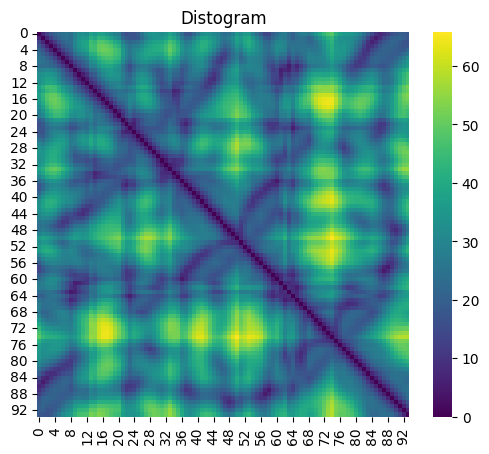

In [23]:
# visualize distogram

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 5))
plt.title("Distogram")
sns.heatmap(distogram[:, :, 0], cmap='viridis', cbar=True)
plt.show()

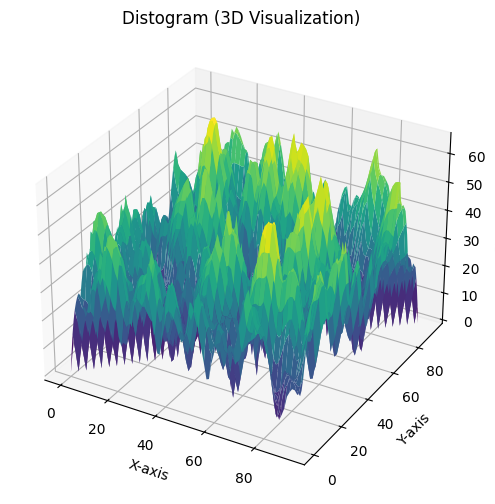

In [24]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Assuming distogram is a 3D NumPy array
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Extract the 2D slice of the distogram to visualize
data = distogram[:, :, 0]

# Create a meshgrid for the X and Y axes
x = np.arange(data.shape[1])
y = np.arange(data.shape[0])
X, Y = np.meshgrid(x, y)

# Plot the surface
ax.plot_surface(X, Y, data, cmap='viridis')

# Add labels and title
ax.set_title("Distogram (3D Visualization)")
ax.set_xlabel("X-axis")
ax.set_ylabel("Y-axis")
ax.set_zlabel("Distance")

plt.show()

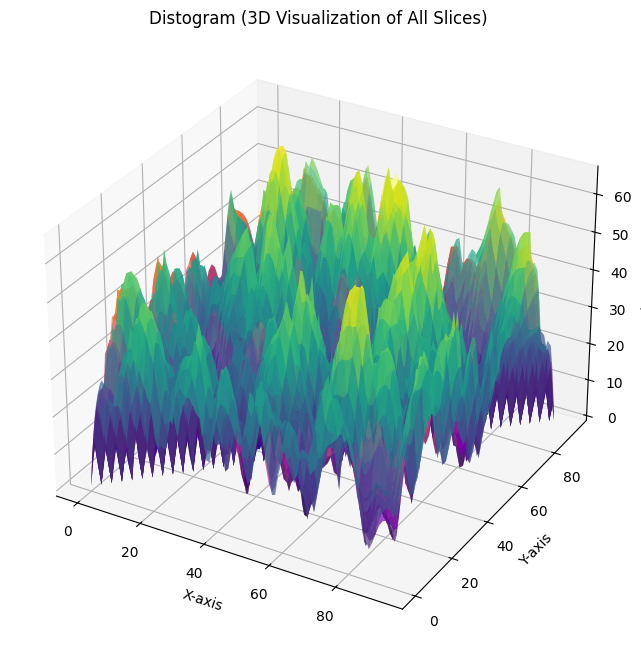

In [27]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Assuming distogram is a 3D NumPy array
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Create a meshgrid for the X and Y axes
x = np.arange(distogram.shape[1])
y = np.arange(distogram.shape[0])
X, Y = np.meshgrid(x, y)

# Define a list of colormaps for variety
colormaps = ['viridis', 'plasma', 'inferno', 'cividis', 'magma']

# Loop through all slices of the distogram
for i in range(distogram.shape[2]):
    data = distogram[:, :, i]
    cmap = colormaps[i % len(colormaps)]  # Cycle through colormaps
    ax.plot_surface(X, Y, data, cmap=cmap, alpha=0.7, label=f"Slice {i}")

# Add labels and title
ax.set_title("Distogram (3D Visualization of All Slices)")
ax.set_xlabel("X-axis")
ax.set_ylabel("Y-axis")
ax.set_zlabel("Distance")

plt.show()

In [42]:
import plotly.graph_objects as go
import numpy as np

# Assuming distogram is a 3D NumPy array
fig = go.Figure()

# Loop through all slices of the distogram
for i in range(distogram.shape[2]):
    data = distogram[:, :, i]
    x = np.arange(data.shape[1])
    y = np.arange(data.shape[0])
    X, Y = np.meshgrid(x, y)

    colormaps=['viridis', 'plasma', 'magma', 'cividis', 'inferno']

    # Add a surface for each slice
    fig.add_trace(go.Surface(
        z=data,
        x=X,
        y=Y,
        colorscale=colormaps[i],  # You can change this to other Plotly colormaps
        # put legend colors in the same order as the slices
        showscale=False,  # Hide color scale for better visualization
        opacity=0.7-i*0.1,  # Set transparency for overlapping slices
        name=f"Slice {i}"
    ))

# Update layout for better visualization
fig.update_layout(
    title="Distogram (3D Visualization of All Slices)",
    scene=dict(
        xaxis_title="X-axis",
        yaxis_title="Y-axis",
        zaxis_title="Distance"
    ),
    margin=dict(l=0, r=0, t=50, b=0)
)

# Show the plot
fig.show()

In [40]:
# i wanna visulaize each of the 3D slices of the distogram as a matrix (2d plot) in plotly, put them ext to each other
import plotly.graph_objects as go
import numpy as np
import plotly.subplots as sp

# Assuming distogram is a 3D NumPy array
fig = sp.make_subplots(
    rows=1,
    cols=distogram.shape[2],
    subplot_titles=[f"Structure {i+1} Distogram" for i in range(distogram.shape[2])],
    specs=[[{'type': 'heatmap'}] * distogram.shape[2]]
)
# Loop through all slices of the distogram
for i in range(distogram.shape[2]):
    data = distogram[:, :, i]
    x = np.arange(data.shape[1])
    y = np.arange(data.shape[0])
    X, Y = np.meshgrid(x, y)

    fig.add_trace(go.Heatmap(
        z=data,
        x=x,
        y=y,
        colorscale='Viridis',
        showscale=False,
    ), row=1, col=i + 1)
# Update layout for better visualization
fig.update_layout(
    title="Distogram (2D Visualization of All Slices)",
    height=400,
    width=1000,
    showlegend=False
)
# Show the plot
fig.show()